**[1]   Importing Library**

In [190]:
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style = 'darkgrid')

In [191]:
#function to display dataframes side by side    
from IPython.display import display_html
def display_side_by_side(args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline;margin-left:50px !important;margin-right: 40px !important"'),raw=True)

In [192]:
# function of boxplot
def boxplot(figRows,figCols,xSize, ySize, features, colors, hue=None, orient='h'):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    features = np.array(features).reshape(figRows, figCols)
    colors = np.array(colors).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
            plot = sns.boxplot(features[row][col], data= train, color=colors[row][col], ax=axesplt, orient=orient, hue=hue)
            plot.set_xlabel(features[row][col],fontsize=20)

In [193]:
# function for distribution plot
def distplot(figRows,figCols,xSize, ySize, features, colors):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    
    features = np.array(features).reshape(figRows, figCols)
    colors = np.array(colors).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
            plot = sns.distplot(train[features[row][col]], color=colors[row][col], ax=axesplt, kde=True, hist_kws={"edgecolor":"k"})
            plot.set_xlabel(features[row][col],fontsize=20)

In [194]:
# function for count plot
def countplot(figRows,figCols,xSize, ySize, features, colors=None,palette=None,hue=None, orient=None, rotation=90):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    features = np.array(features).reshape(figRows, figCols)
    if(colors is not None):
        colors = np.array(colors).reshape(figRows, figCols)
    if(palette is not None):
        palette = np.array(palette).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
                
            if(colors is None):
                plot = sns.countplot(features[row][col], data=train, palette=palette[row][col], ax=axesplt, orient=orient, hue=hue)
            elif(palette is None):
                plot = sns.countplot(features[row][col], data=train, color=colors[row][col], ax=axesplt, orient=orient, hue=hue)
            plot.set_title(features[row][col],fontsize=20)
            plot.set_xlabel(None)
            plot.set_xticklabels(rotation=rotation, labels=plot.get_xticklabels(),fontweight='demibold',fontsize='large')

In [195]:
def value_counts(cols):
    dfs = []
    for col in cols:
        colData = pd.DataFrame(train[col].value_counts(), columns=[col])
        colData['%'] = round((train[col].value_counts(normalize = True))*100,2)
        dfs.append(colData)
    display_side_by_side(dfs)

In [196]:
def point_box_bar_plot(X, y, hue, figRow, figCol, palette='rocket', fontsize='large', fontweight='demibold'):
    sns.set(style="whitegrid")
    f, axes = plt.subplots(3, 1, figsize=(figRow, figCol))
    pplot=sns.pointplot(X,y, data=train, ax=axes[0], linestyles=['--'])
    pplot.set_xlabel(None)
    pplot.set_xticklabels(labels=pplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)
    bxplot=sns.boxplot(X,y, data=train, hue=hue, ax=axes[1],palette='viridis')
    bxplot.set_xlabel(None)
    bxplot.set_xticklabels(labels=bxplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)
    bplot=sns.barplot(X,y, data=train, hue=hue, ax=axes[2],palette=palette)
    bplot.set_xlabel(X,fontsize=20)
    bplot.set_xticklabels(labels=bplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)

In [197]:
def point_bar_plot(X, y, hue, figRow, figCol, palette='rocket', fontsize='large', fontweight='demibold'):
    sns.set(style="whitegrid")
    f, axes = plt.subplots(2, 1, figsize=(figRow, figCol))
    pplot=sns.pointplot(X,y, data=train, ax=axes[0], linestyles=['--'])
    pplot.set_xlabel(None)
    pplot.set_xticklabels(labels=pplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)    
    bplot=sns.barplot(X,y, data=train, hue=hue, ax=axes[1],palette=palette)
    bplot.set_xlabel(X,fontsize=20)
    bplot.set_xticklabels(labels=bplot.get_xticklabels(),fontweight=fontweight,fontsize=fontsize)

In [198]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
train.head()

,Id,age,job,marital,education,default,housing,loan,contact,month,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,25611,49,blue-collar,married,basic.9y,unknown,no,no,cellular,nov,...,4,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8,no
1,26010,37,entrepreneur,married,university.degree,no,no,no,telephone,nov,...,2,999,1,failure,-0.1,93.200,-42.0,4.120,5195.8,no
2,40194,78,retired,married,basic.4y,no,no,no,cellular,jul,...,1,999,0,nonexistent,-1.7,94.215,-40.3,0.870,4991.6,yes
3,297,36,admin.,married,university.degree,no,yes,no,telephone,may,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,36344,59,retired,divorced,university.degree,no,no,no,cellular,jun,...,2,999,0,nonexistent,-2.9,92.963,-40.8,1.262,5076.2,no


**[2]  EDA**

In [199]:
print(f'The shape of training dataset is {train.shape}')
print(f'The shape of test dataset is {test.shape}')

The shape of training dataset is (32950, 22)
The shape of test dataset is (8238, 21)


In [200]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32950 entries, 0 to 32949
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              32950 non-null  int64  
 1   age             32950 non-null  int64  
 2   job             32950 non-null  object 
 3   marital         32950 non-null  object 
 4   education       32950 non-null  object 
 5   default         32950 non-null  object 
 6   housing         32950 non-null  object 
 7   loan            32950 non-null  object 
 8   contact         32950 non-null  object 
 9   month           32950 non-null  object 
 10  day_of_week     32950 non-null  object 
 11  duration        32950 non-null  int64  
 12  campaign        32950 non-null  int64  
 13  pdays           32950 non-null  int64  
 14  previous        32950 non-null  int64  
 15  poutcome        32950 non-null  object 
 16  emp.var.rate    32950 non-null  float64
 17  cons.price.idx  32950 non-null 

ID, age, duration, campaign, pdays, previous is a interger dataset

In [201]:
train.isnull().sum() # there is no null values in the dataSet

Id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [202]:
# 5 point summary of numerical attribute
train.describe()

,Id,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000,32950.000000
mean,20618.796601,40.014112,258.127466,2.560607,962.052413,0.174719,0.080470,93.575881,-40.508489,3.618395,5166.899651
std,11899.673392,10.403636,258.975917,2.752326,187.951096,0.499025,1.571266,0.579209,4.628223,1.735896,72.434812
min,0.000000,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,10315.250000,32.000000,103.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,20632.500000,38.000000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,30952.750000,47.000000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,41187.000000,98.000000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [203]:
pandas_profiling.ProfileReport(train)

In [204]:
train.columns

Index(['Id', 'age', 'job', 'marital', 'education', 'default', 'housing',
       'loan', 'contact', 'month', 'day_of_week', 'duration', 'campaign',
       'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [205]:
# univariate analysis of categorical data

value_counts(['y', 'marital', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'job', 'education'])

,y,%
no,29238,88.73
yes,3712,11.27
,marital,%
married,19953,60.56
single,9257,28.09
divorced,3675,11.15
unknown,65,0.20
,default,%
no,26007,78.93
unknown,6940,21.06


1. output variable(y) has a class imbalance
2. default credits has very less number
3. most of the customer don't involved in previous marketing campaign(poutcome)
4. lot of customer don't have personal loan

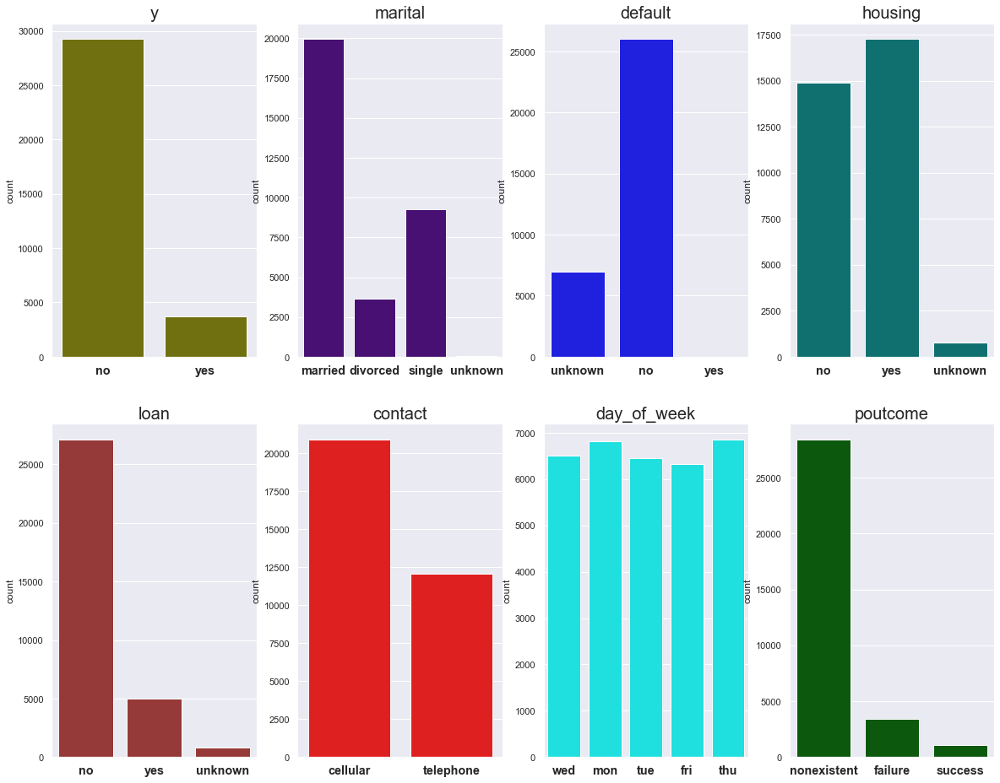

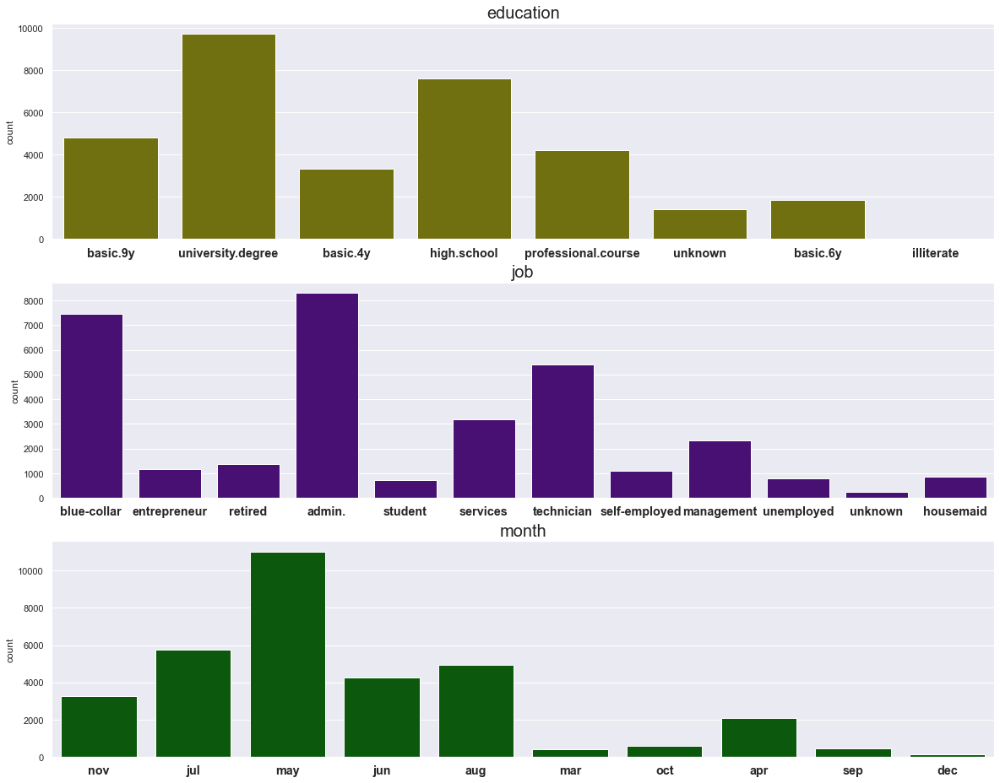

In [206]:
# Countplot

countplot(2, 4, 20, 16, ['y', 'marital', 'default', 'housing', 'loan', 'contact', 'day_of_week', 'poutcome'], \
         ['olive', 'indigo', 'blue', 'teal', 'brown', 'red', 'cyan','darkgreen'], rotation=0)

countplot(3, 1, 20, 16, ['education', 'job', 'month'], \
         ['olive', 'indigo', 'darkgreen'], rotation=0)

### Distribution with respect to target variable

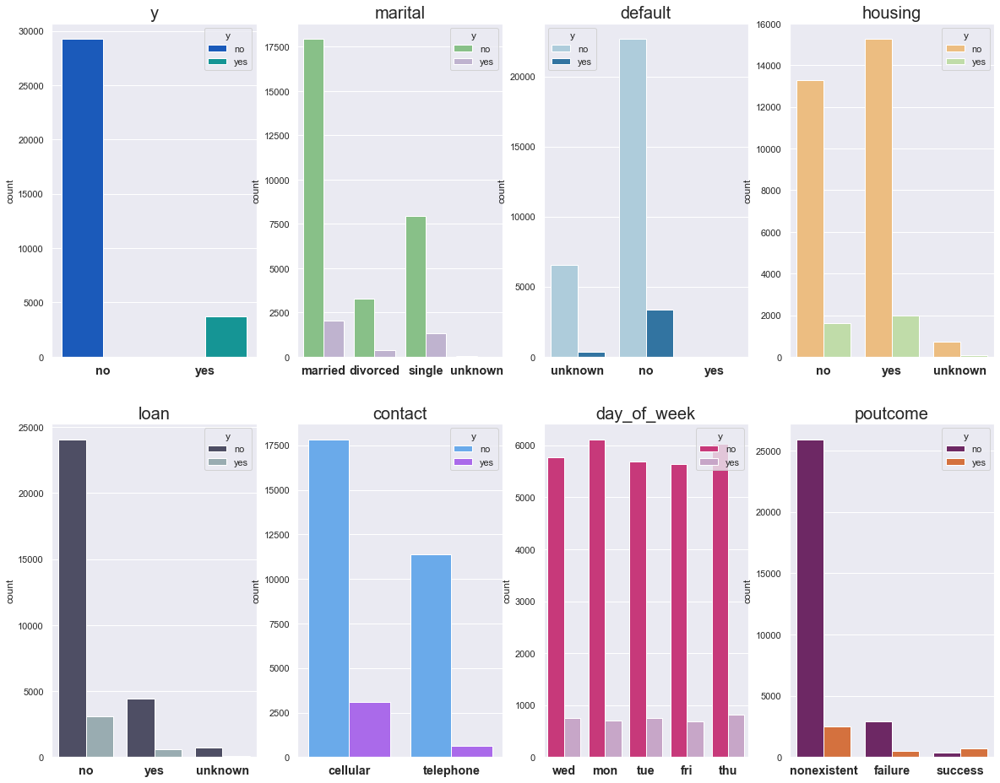

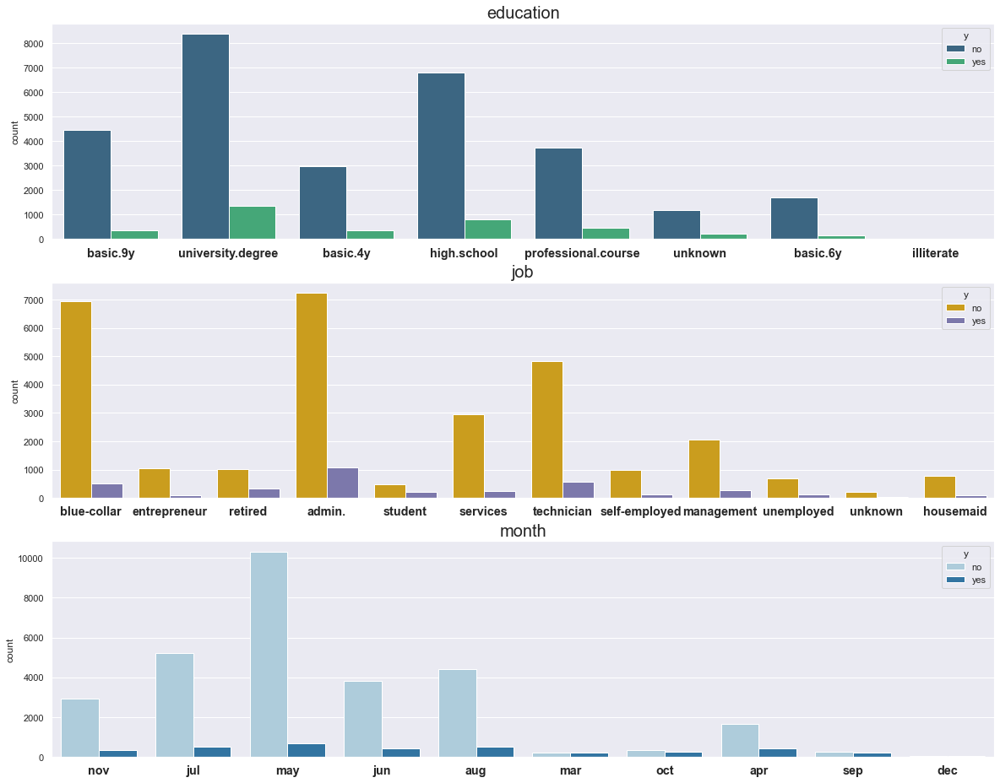

In [207]:


countplot(2, 4, 20, 16, ['y', 'marital', 'default', 'housing', 'loan', 'contact', 'day_of_week', 'poutcome'], \
         palette = ['winter', 'Accent', 'Paired', 'Spectral', 'bone', 'cool', 'PuRd_r','inferno'], rotation=0, hue= 'y')

countplot(3, 1, 20, 16, ['education', 'job', 'month'], \
         palette = ['viridis', 'Dark2_r', 'Paired'], rotation=0, hue= 'y')

* There is no use of day_of week attributes it has no use
* Default attribute has highly  imbalanced

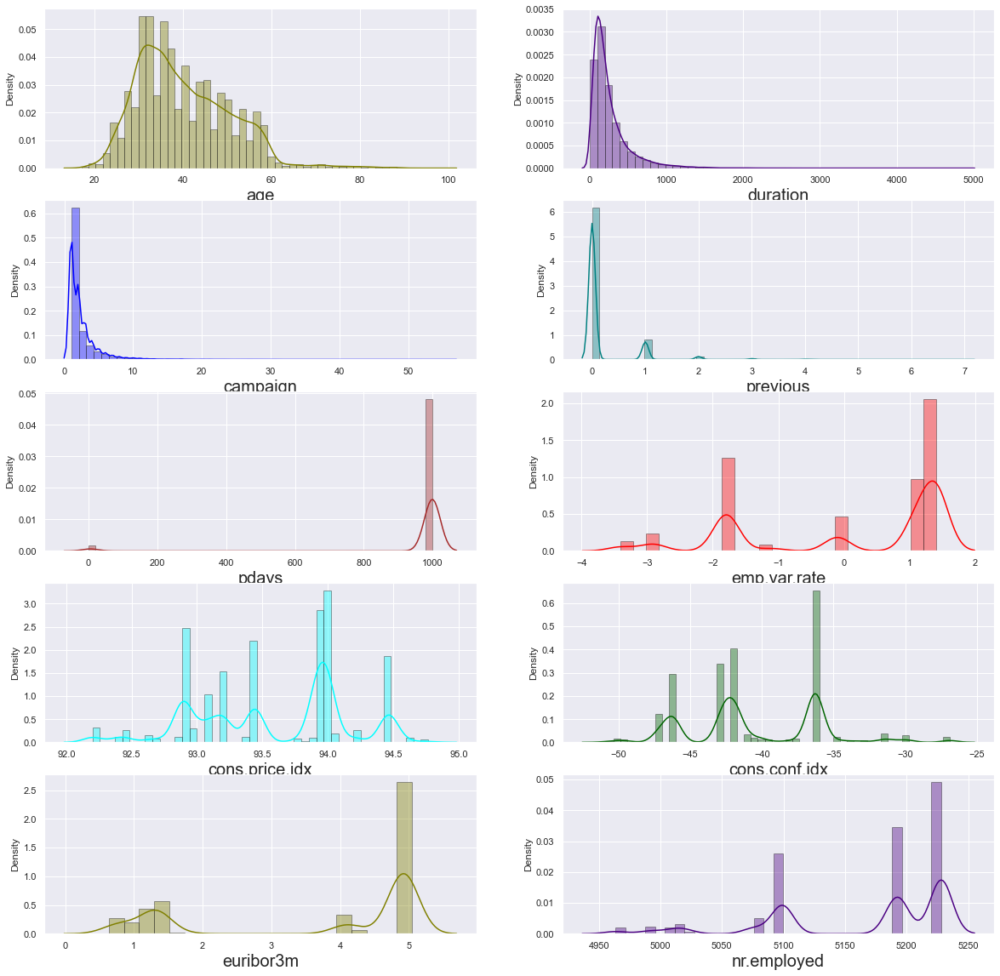

In [208]:
# Distribution plot of Numerical data
distplot(5, 2, 20, 20, ['age', 'duration', 'campaign', 'previous', 'pdays', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'], ['olive', 'indigo', 'blue', 'teal', 'brown', 'red', 'cyan','darkgreen', 'olive', 'indigo'])

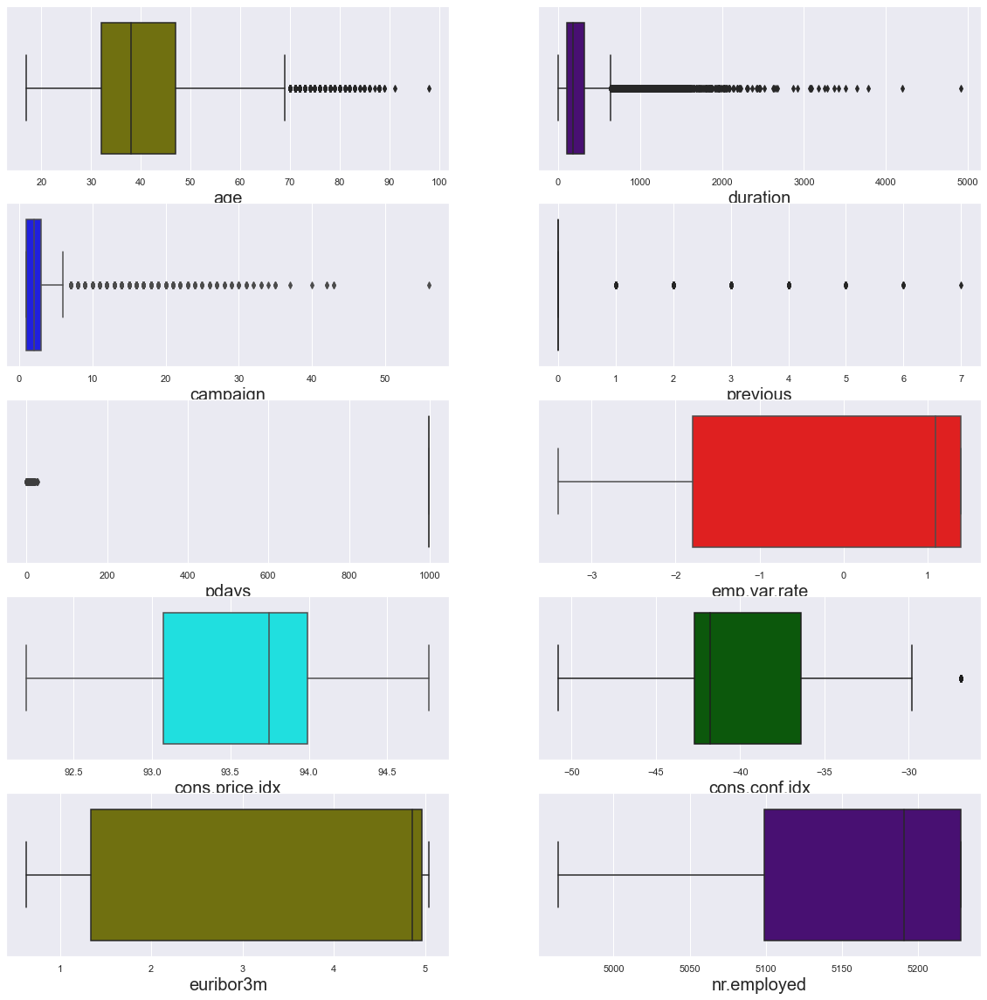

In [209]:
# box plot of Numerical data(Outliers)
boxplot(5, 2, 20, 20, ['age', 'duration', 'campaign', 'previous', 'pdays', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'], ['olive', 'indigo', 'blue', 'teal', 'brown', 'red', 'cyan','darkgreen', 'olive', 'indigo'])

### Finding Skewness of each arguments

In [210]:
# function defining 
def skew(features):
    df = []
    for cols in features:
        df.append(train[cols].skew())
    return pd.DataFrame(np.array(df), index = features, columns = ['Skewness'])

In [211]:
skew(['age', 'duration', 'campaign', 'previous', 'pdays', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'])

,Skewness
age,0.760819
duration,3.326612
campaign,4.742537
previous,3.854724
pdays,-4.890610
emp.var.rate,-0.721077
cons.price.idx,-0.231165
cons.conf.idx,0.305846
euribor3m,-0.705554
nr.employed,-1.043085


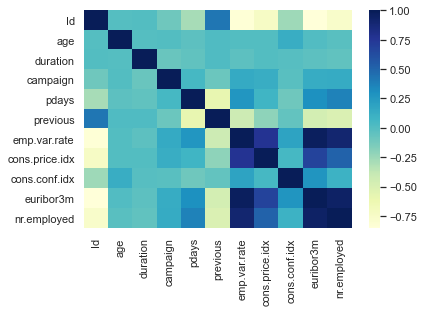

In [212]:
sns.heatmap(train.corr(), cmap='YlGnBu')

### Bivariate Analysis of features

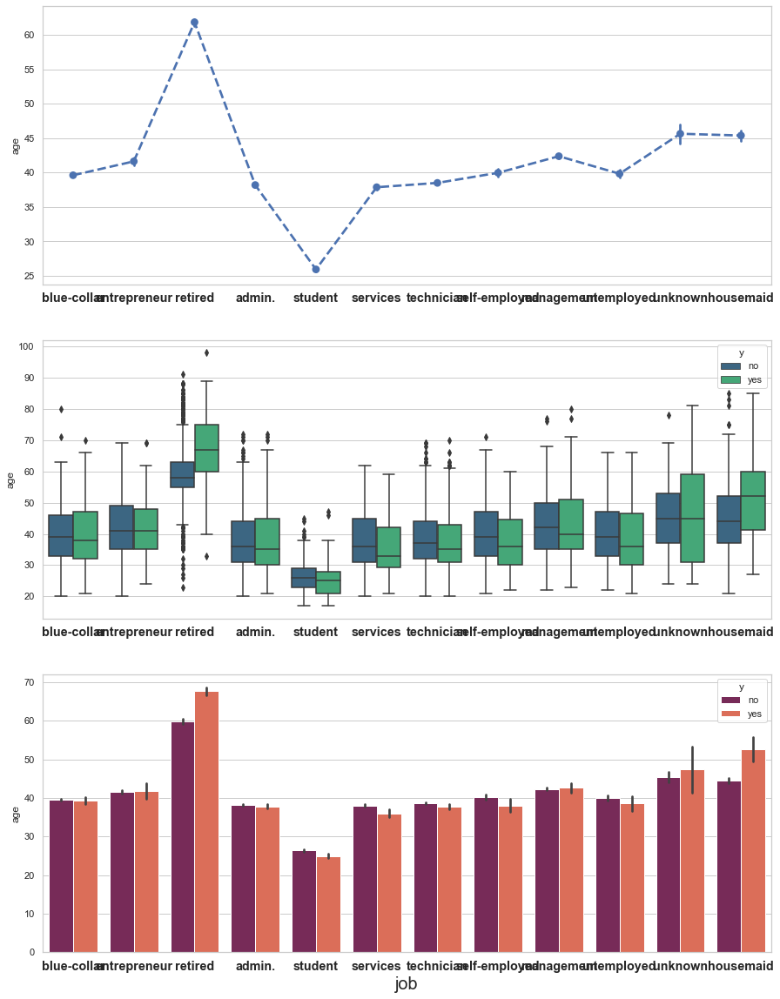

In [213]:
point_box_bar_plot('job', 'age', 'y', 15, 20)

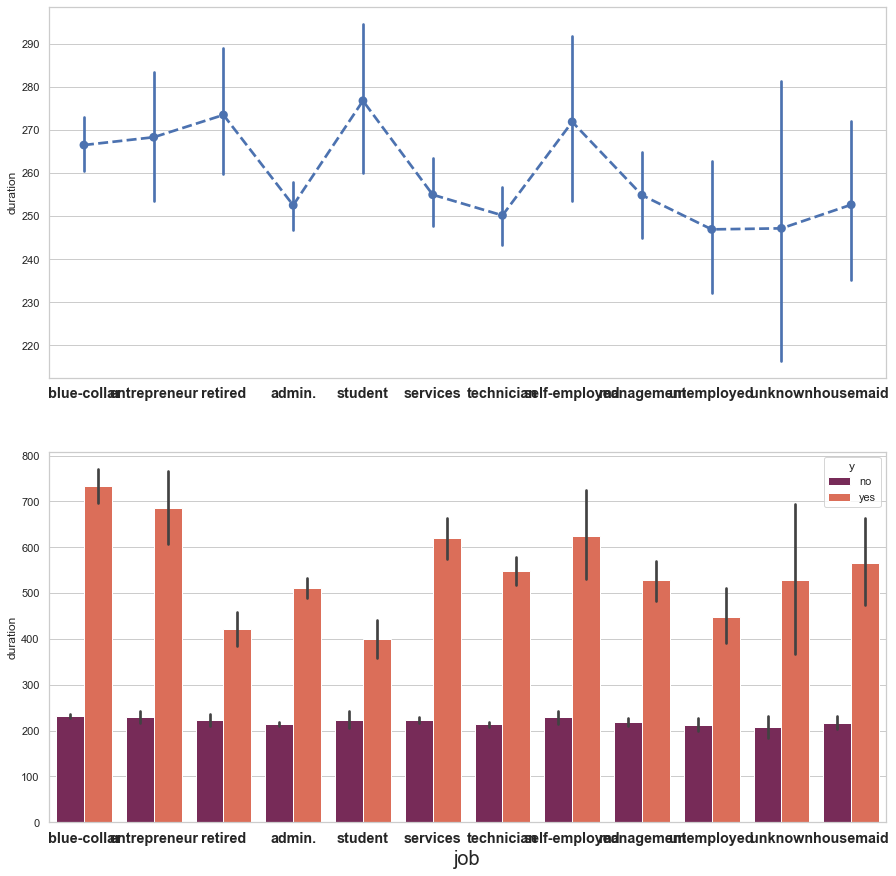

In [214]:
point_bar_plot('job', 'duration', 'y', 15, 15)

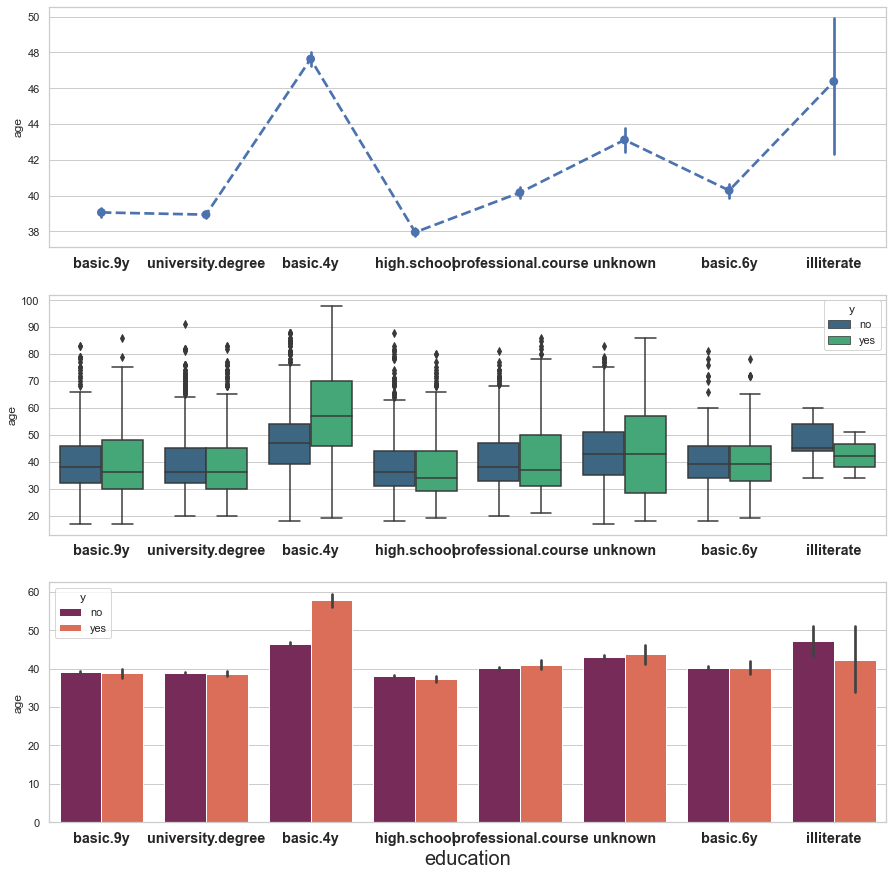

In [215]:
point_box_bar_plot('education', 'age', 'y', 15, 15)

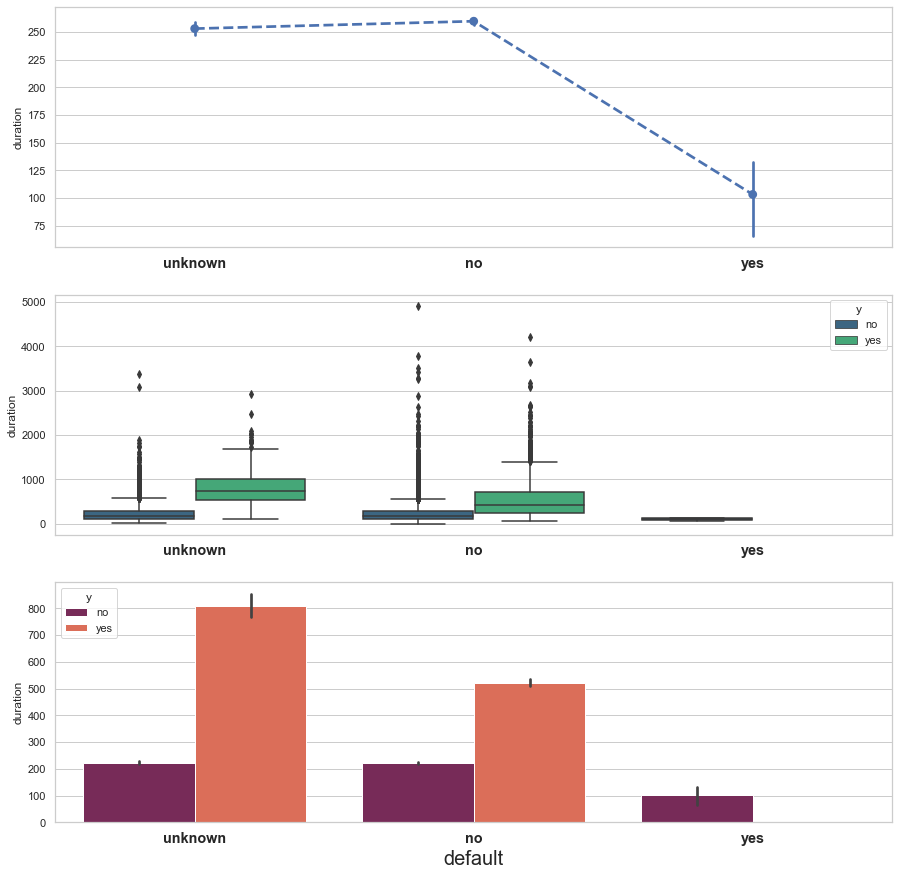

In [216]:
point_box_bar_plot('default', 'duration', 'y', 15, 15)

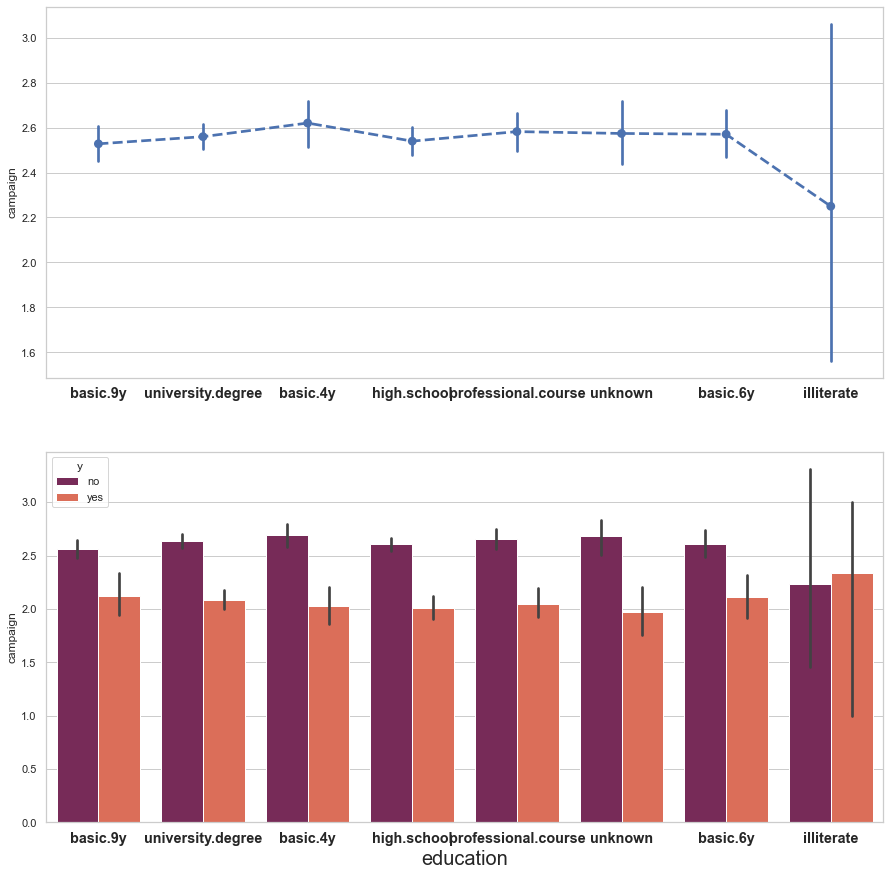

In [217]:
point_bar_plot('education', 'campaign', 'y', 15, 15)

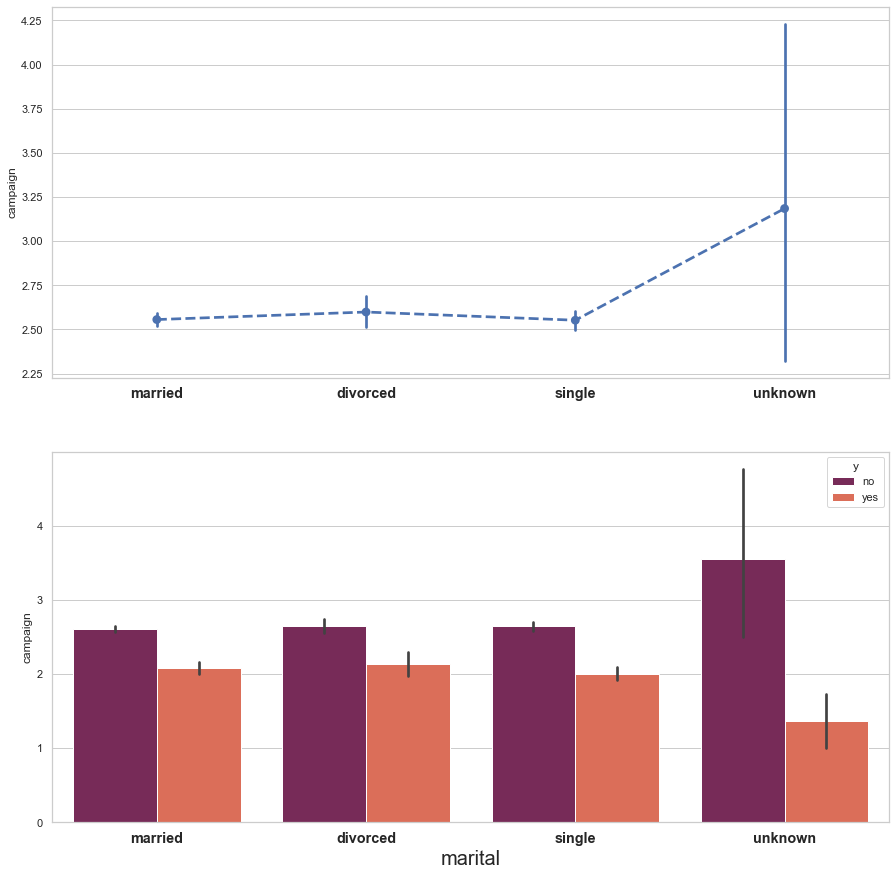

In [218]:
point_bar_plot('marital', 'campaign', 'y', 15, 15)

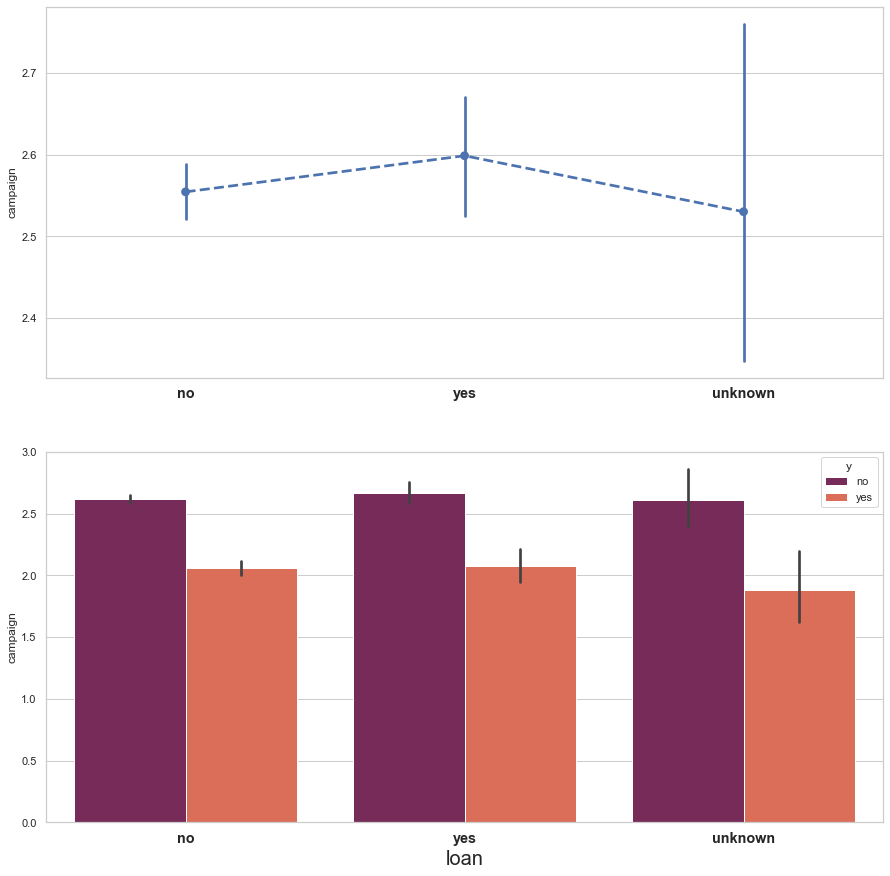

In [219]:
point_bar_plot('loan', 'campaign', 'y', 15, 15)

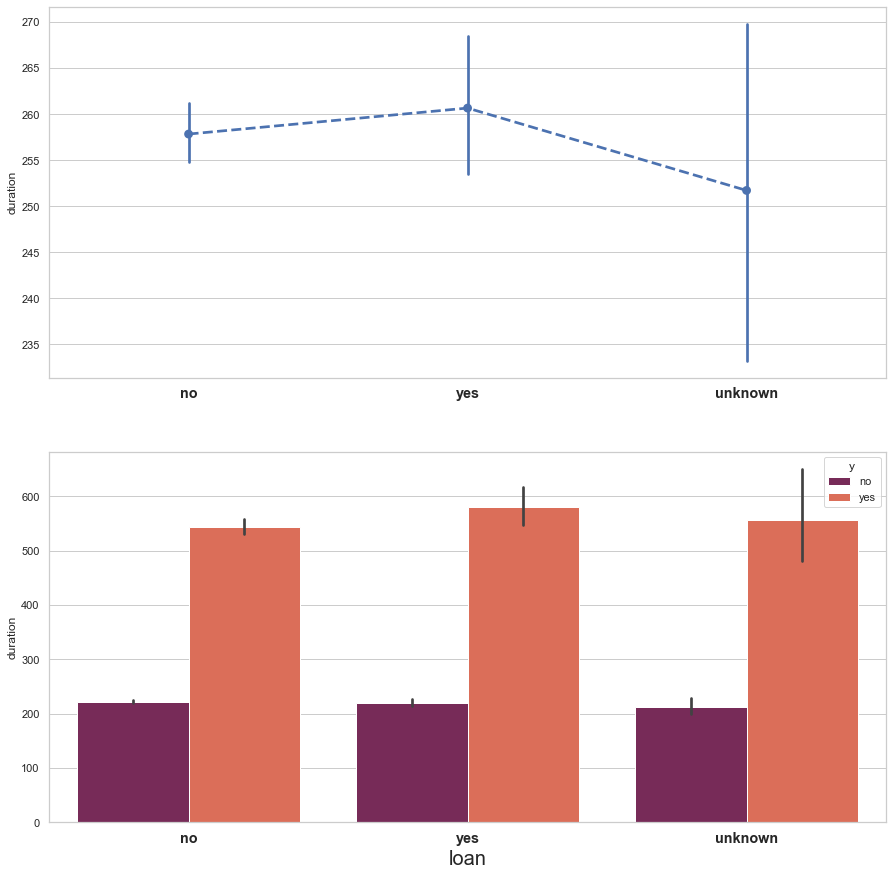

In [220]:
point_bar_plot('loan', 'duration', 'y', 15, 15)

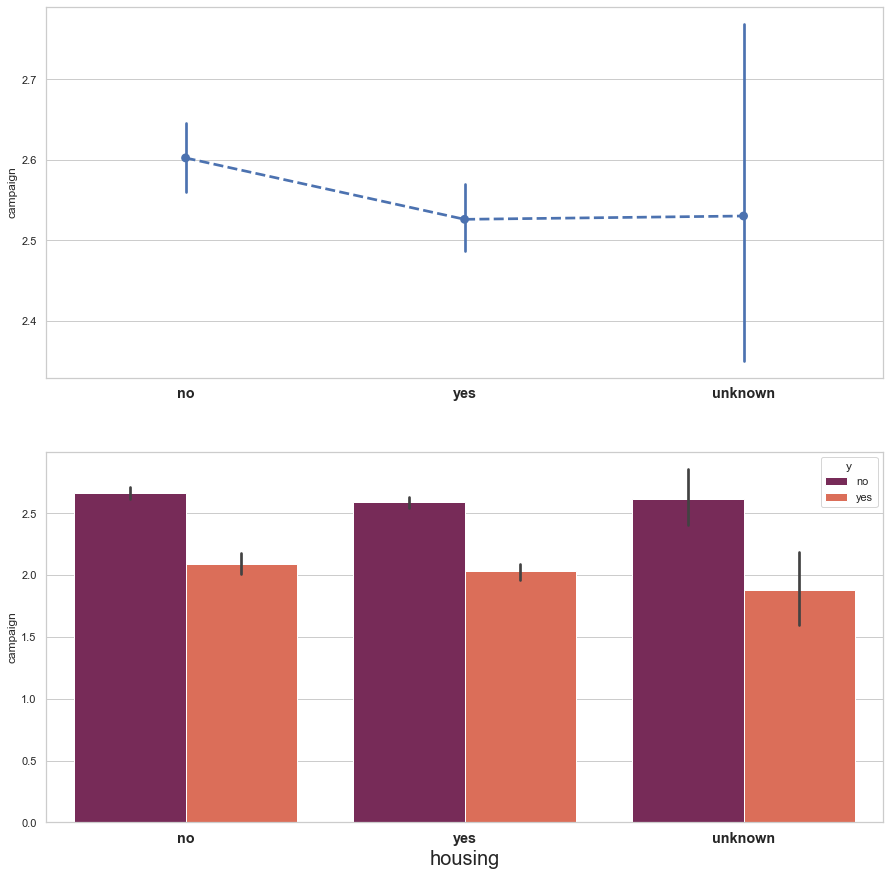

In [221]:
point_bar_plot('housing', 'campaign', 'y', 15, 15)

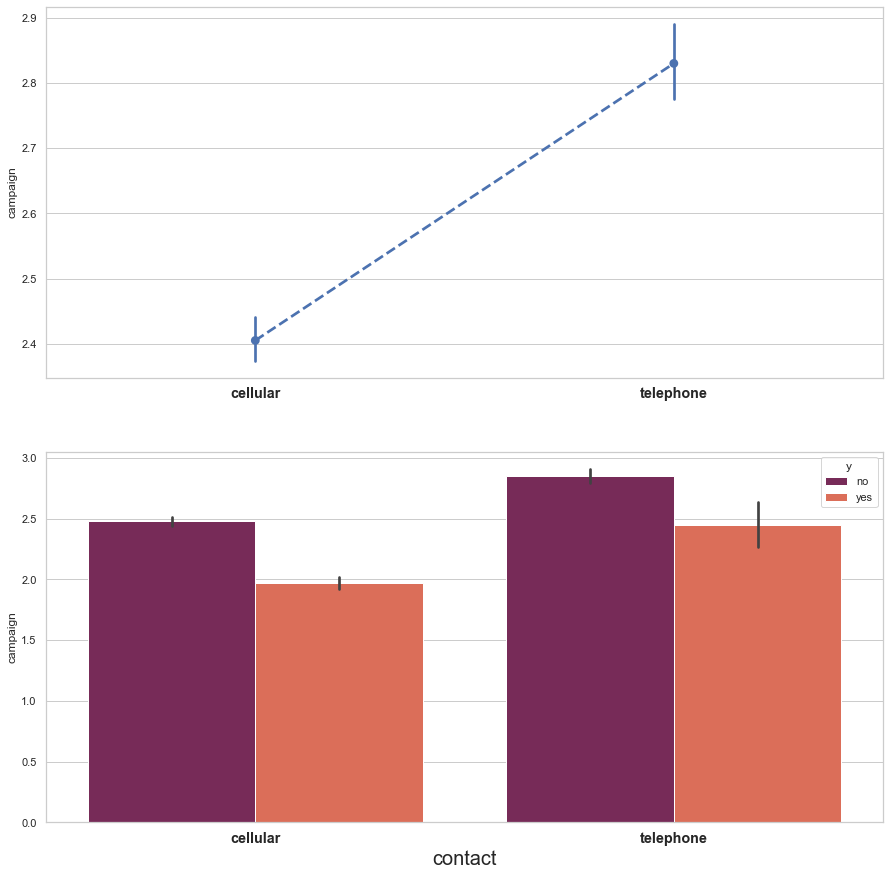

In [222]:
point_bar_plot('contact', 'campaign', 'y', 15, 15)

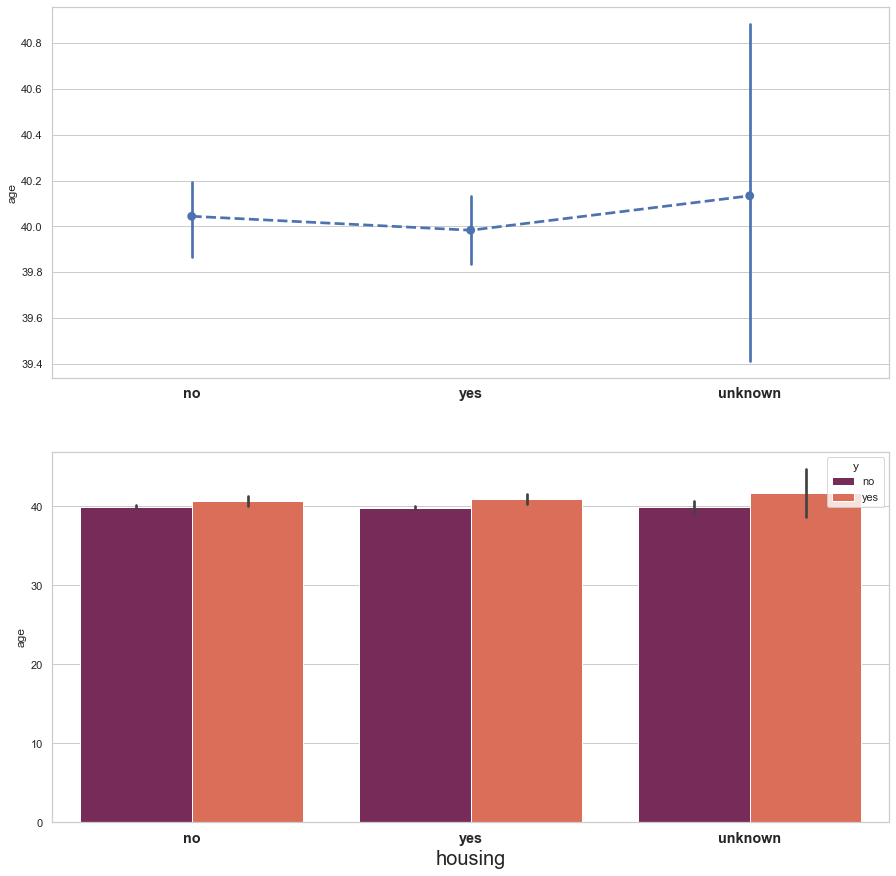

In [223]:
point_bar_plot('housing', 'age', 'y', 15, 15)

In [224]:
#sns.pairplot(train, hue='y', palette='rocket')

### Droping all these records which has unknown values

In [225]:
train.drop(train[train.marital == 'unknown'].index, inplace = True)
test.drop(test[test.marital == 'unknown'].index, inplace = True)

In [226]:
train.drop(train[train.default == 'unknown'].index, inplace = True)
test.drop(test[test.default == 'unknown'].index, inplace = True)

In [227]:
train.drop(train[train.housing == 'unknown'].index, inplace = True)
test.drop(test[test.housing == 'unknown'].index, inplace = True)

In [228]:
train.drop(train[train.loan == 'unknown'].index, inplace = True)
test.drop(test[test.loan == 'unknown'].index, inplace = True)

In [229]:
train.drop(train[train.job == 'unknown'].index, inplace = True)
test.drop(test[test.job == 'unknown'].index, inplace = True)

In [230]:
train.drop(train[train.education == 'unknown'].index, inplace = True)
test.drop(test[test.education == 'unknown'].index, inplace = True)

In [231]:
train.shape

(24305, 22)

In [232]:
test.shape

(6183, 21)

In [233]:
value_counts(['y', 'marital', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'job', 'education'])

,y,%
no,21237,87.38
yes,3068,12.62
,marital,%
married,13952,57.40
single,7546,31.05
divorced,2807,11.55
,default,%
no,24302,99.99
yes,3,0.01
,housing,%


 Default is highly skewed. So that we have to drop it

In [234]:
train.drop('default', inplace= True, axis = 1)
test.drop('default', inplace= True, axis = 1)

We do not duration before. So we have to drop it.

In [235]:
train.drop('duration', inplace= True, axis = 1)
test.drop('duration', inplace= True, axis = 1)

In [236]:
train.drop('Id', inplace= True, axis = 1)
test.drop('Id', inplace= True, axis = 1)

In [237]:
train.drop('day_of_week', inplace= True, axis = 1)
test.drop('day_of_week', inplace= True, axis = 1)

In [238]:
train.shape

(24305, 18)

In [239]:
test.shape

(6183, 17)

In [240]:
from scipy.stats import zscore
def remove_outliers(col, data):
    outlier_col = col + "_outliers"
    data[outlier_col] = data[col]
    data[outlier_col]= zscore(data[outlier_col])

    condition = (data[outlier_col]>3) | (data[outlier_col]<-3)
    print(data[condition].shape)
    data.drop(data[condition].index, axis = 0, inplace = True)
    data.drop(outlier_col, axis=1, inplace=True)

In [241]:
remove_outliers('campaign', train)
remove_outliers('previous', train)
remove_outliers('pdays', train)
remove_outliers('age', train)

(459, 19)
(729, 19)
(611, 19)
(240, 19)


In [242]:
train.shape

(22266, 18)

In [243]:
y = train['y']
train.drop('y', inplace= True, axis = 1)


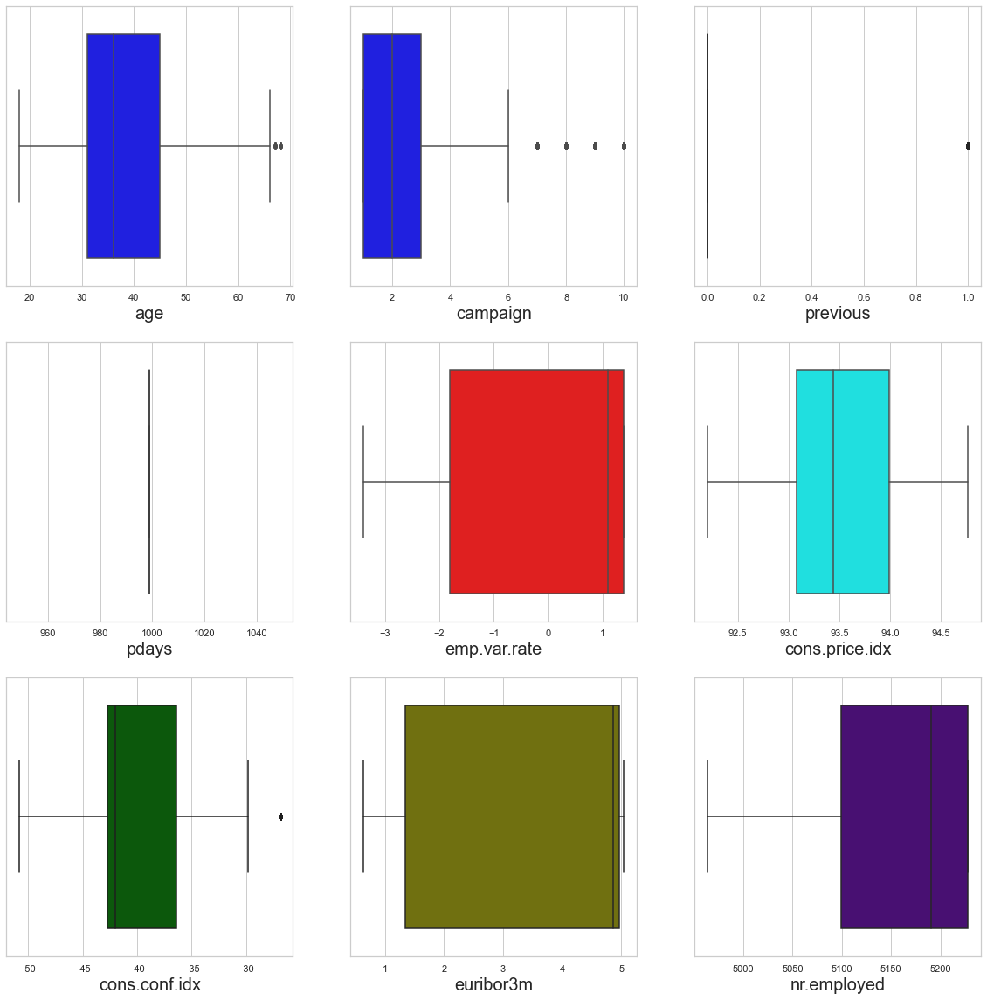

In [244]:
# box plot of Numerical data(Outliers)
boxplot(3, 3, 20, 20, ['age','campaign', 'previous', 'pdays', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'], ['blue','blue', 'teal', 'brown', 'red', 'cyan','darkgreen', 'olive', 'indigo'])

In [245]:
df = pd.get_dummies(train)
df_test = pd.get_dummies(test)
df.shape


(22266, 48)

In [246]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22266 entries, 1 to 32949
Data columns (total 48 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            22266 non-null  int64  
 1   campaign                       22266 non-null  int64  
 2   pdays                          22266 non-null  int64  
 3   previous                       22266 non-null  int64  
 4   emp.var.rate                   22266 non-null  float64
 5   cons.price.idx                 22266 non-null  float64
 6   cons.conf.idx                  22266 non-null  float64
 7   euribor3m                      22266 non-null  float64
 8   nr.employed                    22266 non-null  float64
 9   job_admin.                     22266 non-null  uint8  
 10  job_blue-collar                22266 non-null  uint8  
 11  job_entrepreneur               22266 non-null  uint8  
 12  job_housemaid                  22266 non-null 

In [247]:
df.drop(['job_student','marital_divorced', 'education_basic.4y', 'contact_telephone', 'month_dec', 'poutcome_nonexistent'], 
                  axis=1, inplace=True)

In [248]:
df_test.drop(['job_student','marital_divorced', 'education_basic.4y', 'contact_telephone', 'month_dec', 'poutcome_nonexistent'], 
                  axis=1, inplace=True)

In [249]:
from sklearn.preprocessing import StandardScaler
std_scale = StandardScaler()
df[['age', 'campaign','pdays','previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m']] = std_scale.fit_transform(df[['age', 'campaign','pdays','previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m']])

In [262]:
X = df
y = y.replace({'yes':1, 'no' : 0})


In [263]:
y.head()

1    0
3    0
4    0
5    0
6    1
Name: y, dtype: int64

In [264]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.model_selection import train_test_split

In [265]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 2)

### Fitting the model using Logistic Regression

In [266]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [267]:
model.score(X_train, y_train)

0.9006287895800584

In [268]:
predection = model.predict(X_test)

In [269]:
dataframe  = pd.DataFrame({'Actual' : y_test, 'Predected' : predection})
dataframe

,Actual,Predected
4406,0,0
15570,1,0
7441,0,0
8889,0,0
25690,0,0
...,...,...
28930,0,0
8808,0,0
14747,0,0
30668,0,0


### Finding Accuracy_Score

In [270]:
accuracy_score(predection, y_test)

0.9014369106421194

### Classification report

In [271]:
confusion_matrix(predection, y_test)

array([[4005,  433],
       [   6,   10]], dtype=int64)

In [272]:
recall_score(predection, y_test)

0.625

In [273]:
precision_score(y_test, predection)

0.625

In [274]:
classification_report(predection, y_test)

'              precision    recall  f1-score   support\n\n           0       1.00      0.90      0.95      4438\n           1       0.02      0.62      0.04        16\n\n    accuracy                           0.90      4454\n   macro avg       0.51      0.76      0.50      4454\nweighted avg       0.99      0.90      0.94      4454\n'

### predection on Test data

In [275]:
test_predecrion = model.predict(df_test)